In [1]:
import os
import csv
import time
import pickle
import numpy as np
import pandas as pd
from source import SAX
from source import oneD_SAX
from source.ABBA import ABBA
from software.qabba import fastQABBA
from fABBA import fABBA
from tqdm import tqdm
import matplotlib.pyplot as plt
from source.figdefault import figdefault
from tslearn.metrics import dtw as dtw
from fABBA import inverse_compress
from fABBA import inverse_digitize
import warnings
warnings.filterwarnings("ignore")

In [2]:
class Error(Exception):
    """Base class for other exceptions"""
    pass

class TimeSeriesTooShort(Error):
    """Raised when time series is too short"""
    pass

class NotEnoughPieces(Error):
    """Raised when not enough pieces"""
    pass

class CompressionTolHigh(Error):
    """Raised when not enough pieces"""
    pass

class VariantsError(Error):
    """Raised when not enough unique pieces"""
    # Making assumption Ckmeans is available and suitable tol and scl is given.
    pass

class UnknownError(Error):
    """Raised when not enough unique pieces"""
    # Making assumption Ckmeans is available and suitable tol and scl is given.
    pass

class ABBAError(Error):
   # Error arising from ABBA.
    pass

class fABBAError(Error):
    # Error arising from fABBA
    pass


class QABBA1Error(Error):
    # Error arising from QABBA
    pass

class QABBA2Error(Error):
    # Error arising from QABBA
    pass

datadir = 'UCR2018/'
# tolerances
tol = [0.05*i for i in range(1,11)]

# If pickle file does not exist, make it.
# if not os.path.exists('scl'+str(scl)+'.pkl'):

# Calculate number of time series, to provide progess information.
ts_count = 0
for root, dirs, files in os.walk(datadir):
    for file in files:
        if file.endswith('tsv'):
            with open(os.path.join(root, file)) as f:
                content = f.readlines()
                ts_count += len(content)
print('Number of time series:', ts_count)


# Construct list of NaNs
D_SAX_2 = ts_count*[np.NaN]
D_oneD_SAX_2 = ts_count*[np.NaN]
D_ABBA1_2 = ts_count*[np.NaN]
D_fABBA_2 = ts_count*[np.NaN]
D_QABBA1_2 = ts_count*[np.NaN]
D_QABBA2_2 = ts_count*[np.NaN]

D_SAX_DTW = ts_count*[np.NaN]
D_oneD_SAX_DTW = ts_count*[np.NaN]
D_ABBA1_DTW = ts_count*[np.NaN]
D_fABBA_DTW = ts_count*[np.NaN]
D_QABBA1_DTW = ts_count*[np.NaN]
D_QABBA2_DTW = ts_count*[np.NaN]

D_SAX_2_diff = ts_count*[np.NaN]
D_oneD_SAX_2_diff = ts_count*[np.NaN]
D_ABBA1_2_diff = ts_count*[np.NaN]
D_fABBA_2_diff = ts_count*[np.NaN]
D_QABBA1_2_diff = ts_count*[np.NaN]
D_QABBA2_2_diff = ts_count*[np.NaN]

D_SAX_DTW_diff = ts_count*[np.NaN]
D_oneD_SAX_DTW_diff = ts_count*[np.NaN]
D_ABBA1_DTW_diff = ts_count*[np.NaN]
D_fABBA_DTW_diff = ts_count*[np.NaN]
D_QABBA1_DTW_diff = ts_count*[np.NaN]
D_QABBA2_DTW_diff = ts_count*[np.NaN]

D_SAX_time = ts_count*[np.NaN]
D_oneD_SAX_time = ts_count*[np.NaN]
D_ABBA1_time = ts_count*[np.NaN]
D_fABBA_time = ts_count*[np.NaN]
D_QABBA1_time = ts_count*[np.NaN]
D_QABBA2_time = ts_count*[np.NaN]

ts_name = ts_count*[''] # time series name for debugging
count = ts_count*[0]
compression = ts_count*[np.NaN] # Store amount of compression
tol_used = ts_count*[np.NaN] # Store tol used
error = ts_count*[0] # track errors

csymbolicNum = list()
cpiecesNum = list()
ctsname = list()
ctolist = list()


Number of time series: 201761


file: DodgerLoopWeekend_TRAIN.tsv


20it [00:02,  6.93it/s]


file: DodgerLoopWeekend_TEST.tsv


138it [00:38,  3.58it/s]


file: Wine_TRAIN.tsv


57it [00:14,  3.91it/s]


file: Wine_TEST.tsv


54it [00:17,  3.06it/s]


file: Strawberry_TRAIN.tsv


613it [02:50,  3.60it/s]


file: Strawberry_TEST.tsv


370it [01:56,  3.17it/s]


file: ItalyPowerDemand_TRAIN.tsv


67it [00:00, 1932.41it/s]


file: ItalyPowerDemand_TEST.tsv


1029it [00:00, 2240.97it/s]


file: PLAID_TRAIN.tsv


537it [02:52,  3.12it/s]


file: PLAID_TEST.tsv


537it [02:47,  3.21it/s]


file: BirdChicken_TEST.tsv


20it [00:05,  3.34it/s]


file: BirdChicken_TRAIN.tsv


20it [00:09,  2.10it/s]


file: ProximalPhalanxTW_TEST.tsv


205it [00:00, 4686.60it/s]


file: ProximalPhalanxTW_TRAIN.tsv


400it [00:00, 2428.37it/s]


file: Symbols_TRAIN.tsv


25it [00:08,  2.80it/s]


file: Symbols_TEST.tsv


995it [04:51,  3.41it/s]


file: FiftyWords_TRAIN.tsv


450it [01:38,  4.58it/s]


file: FiftyWords_TEST.tsv


455it [00:57,  7.85it/s]


file: ChlorineConcentration_TEST.tsv


3840it [11:29,  5.57it/s]


file: ChlorineConcentration_TRAIN.tsv


467it [01:12,  6.45it/s]


file: Lightning2_TRAIN.tsv


60it [00:18,  3.19it/s]


file: Lightning2_TEST.tsv


61it [00:22,  2.68it/s]


file: UWaveGestureLibraryX_TEST.tsv


3582it [14:11,  4.21it/s]


file: UWaveGestureLibraryX_TRAIN.tsv


896it [02:58,  5.03it/s]


file: FacesUCR_TRAIN.tsv


200it [00:09, 21.90it/s]


file: FacesUCR_TEST.tsv


2050it [05:51,  5.83it/s]


file: Plane_TEST.tsv


105it [00:11,  9.40it/s]


file: Plane_TRAIN.tsv


105it [00:17,  6.07it/s]


file: RefrigerationDevices_TRAIN.tsv


375it [03:14,  1.93it/s]


file: RefrigerationDevices_TEST.tsv


375it [02:30,  2.50it/s]


file: DodgerLoopWeekend_TRAIN.tsv


20it [00:07,  2.62it/s]


file: DodgerLoopWeekend_TEST.tsv


138it [00:37,  3.64it/s]


file: PLAID_TRAIN.tsv


537it [03:51,  2.32it/s]


file: PLAID_TEST.tsv


537it [04:02,  2.21it/s]


file: AllGestureWiimoteZ_TRAIN.tsv


300it [00:44,  6.72it/s]


file: AllGestureWiimoteZ_TEST.tsv


700it [01:50,  6.32it/s]


file: ShakeGestureWiimoteZ_TEST.tsv


50it [00:07,  6.45it/s]


file: ShakeGestureWiimoteZ_TRAIN.tsv


50it [00:08,  6.06it/s]


file: AllGestureWiimoteX_TEST.tsv


700it [02:00,  5.80it/s]


file: AllGestureWiimoteX_TRAIN.tsv


300it [00:51,  5.85it/s]


file: MelbournePedestrian_TRAIN.tsv


1194it [00:00, 13335.28it/s]


file: MelbournePedestrian_TEST.tsv


2439it [00:00, 9715.09it/s]


file: GestureMidAirD3_TRAIN.tsv


208it [00:25,  8.14it/s]


file: GestureMidAirD3_TEST.tsv


130it [00:15,  8.24it/s]


file: GesturePebbleZ2_TRAIN.tsv


146it [00:23,  6.23it/s]


file: GesturePebbleZ2_TEST.tsv


158it [00:24,  6.36it/s]


file: GestureMidAirD1_TRAIN.tsv


208it [00:26,  7.98it/s]


file: GestureMidAirD1_TEST.tsv


130it [00:06, 19.14it/s]


file: AllGestureWiimoteY_TEST.tsv


700it [00:47, 14.65it/s]


file: AllGestureWiimoteY_TRAIN.tsv


300it [00:18, 15.85it/s]


file: PickupGestureWiimoteZ_TEST.tsv


50it [00:02, 18.12it/s]


file: PickupGestureWiimoteZ_TRAIN.tsv


50it [00:02, 17.13it/s]


file: DodgerLoopGame_TEST.tsv


138it [00:09, 14.98it/s]


file: DodgerLoopGame_TRAIN.tsv


20it [00:01, 12.57it/s]


file: DodgerLoopDay_TEST.tsv


80it [00:06, 12.80it/s]


file: DodgerLoopDay_TRAIN.tsv


78it [00:23,  3.37it/s]


file: GestureMidAirD2_TEST.tsv


130it [00:33,  3.92it/s]


file: GestureMidAirD2_TRAIN.tsv


208it [00:54,  3.80it/s]


file: GesturePebbleZ1_TRAIN.tsv


132it [00:39,  3.37it/s]


file: GesturePebbleZ1_TEST.tsv


172it [00:51,  3.36it/s]


file: ProximalPhalanxOutlineAgeGroup_TEST.tsv


205it [00:00, 3897.47it/s]


file: ProximalPhalanxOutlineAgeGroup_TRAIN.tsv


400it [00:00, 2966.01it/s]


file: FordB_TEST.tsv


810it [03:36,  3.74it/s]


file: FordB_TRAIN.tsv


3636it [15:53,  3.81it/s]


file: Mallat_TRAIN.tsv


55it [00:08,  6.64it/s]


file: Mallat_TEST.tsv


2345it [05:42,  6.84it/s]


file: SemgHandMovementCh2_TRAIN.tsv


28it [00:05,  3.76it/s]IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

2425it [05:26,  7.43it/s]


file: MixedShapesSmallTrain_TRAIN.tsv


100it [00:14,  7.02it/s]


file: ACSF1_TEST.tsv


100it [00:18,  5.45it/s]


file: ACSF1_TRAIN.tsv


100it [00:19,  5.17it/s]


file: Trace_TEST.tsv


100it [00:03, 32.47it/s]


file: Trace_TRAIN.tsv


100it [00:03, 31.54it/s]


file: SyntheticControl_TRAIN.tsv


300it [00:00, 8752.05it/s]


file: SyntheticControl_TEST.tsv


300it [00:00, 9957.36it/s]


file: CBF_TRAIN.tsv


30it [00:01, 25.18it/s]


file: CBF_TEST.tsv


900it [00:27, 32.72it/s]


file: MedicalImages_TEST.tsv


760it [00:00, 10950.17it/s]


file: MedicalImages_TRAIN.tsv


381it [00:00, 11010.64it/s]


file: ElectricDevices_TEST.tsv


7711it [00:00, 10957.27it/s]


file: ElectricDevices_TRAIN.tsv


8926it [00:00, 10951.37it/s]


file: AllGestureWiimoteX_TEST.tsv


700it [00:11, 59.08it/s] 


file: AllGestureWiimoteX_TRAIN.tsv


300it [00:05, 56.24it/s]


file: Lightning7_TRAIN.tsv


70it [00:03, 20.06it/s]


file: Lightning7_TEST.tsv


73it [00:03, 21.07it/s]


file: GunPoint_TRAIN.tsv


50it [00:01, 45.00it/s]


file: GunPoint_TEST.tsv


136it [00:02, 52.68it/s]IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

4500it [01:37, 46.30it/s]


file: ECG5000_TRAIN-checkpoint.tsv


500it [00:10, 46.94it/s]


file: SemgHandSubjectCh2_TRAIN.tsv


450it [01:24,  5.32it/s]


file: SemgHandSubjectCh2_TEST.tsv


450it [01:20,  5.60it/s]


file: FordA_TEST.tsv


849it [01:00, 10.62it/s]IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

3601it [05:36, 10.69it/s]


file: Yoga_TRAIN.tsv


300it [00:11, 26.47it/s]IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

2425it [05:36,  7.20it/s]


file: MixedShapesRegularTrain_TRAIN.tsv


500it [01:16,  6.53it/s]


file: DistalPhalanxOutlineAgeGroup_TRAIN.tsv


400it [00:00, 11266.91it/s]


file: DistalPhalanxOutlineAgeGroup_TEST.tsv


139it [00:00, 11297.30it/s]


file: PhalangesOutlinesCorrect_TRAIN.tsv


1800it [00:00, 11935.08it/s]


file: PhalangesOutlinesCorrect_TEST.tsv


858it [00:00, 11556.30it/s]


file: StarLightCurves_TRAIN.tsv


312it [00:46,  6.74it/s]IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

1686it [04:08,  7.15it/s]IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



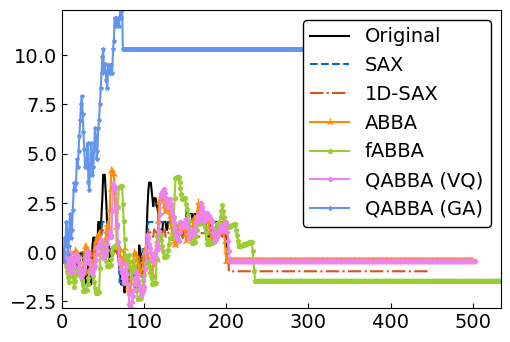

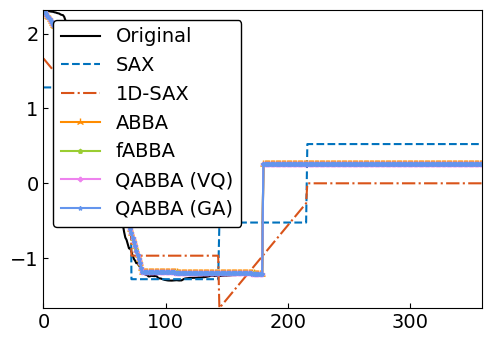

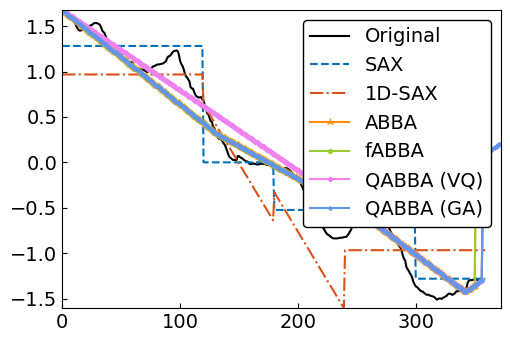

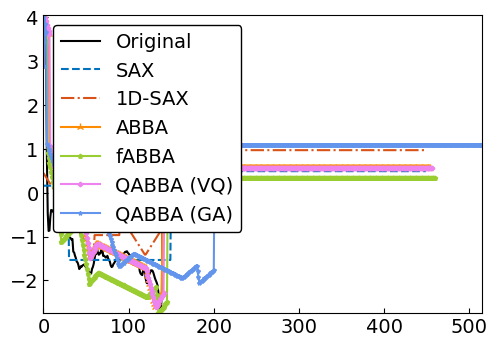

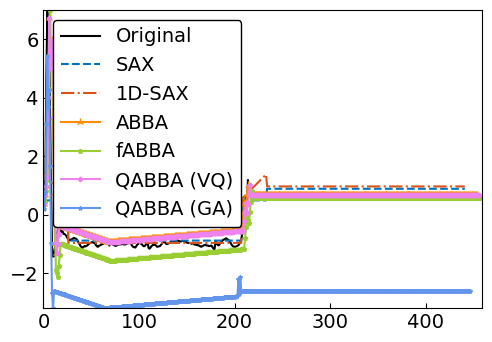

...

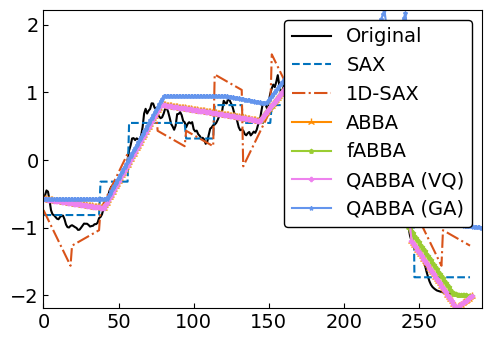

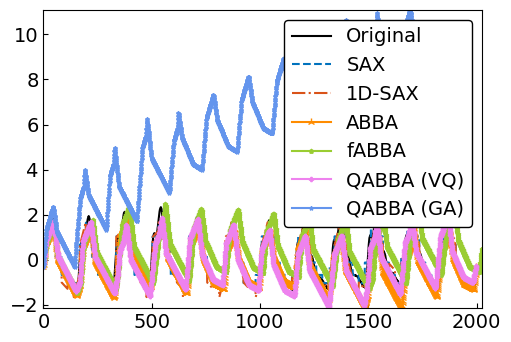

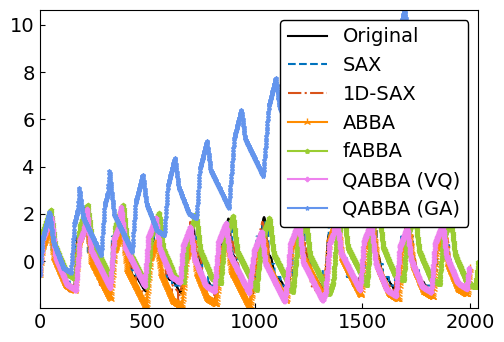

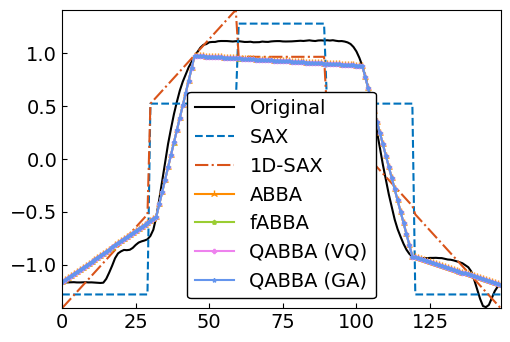

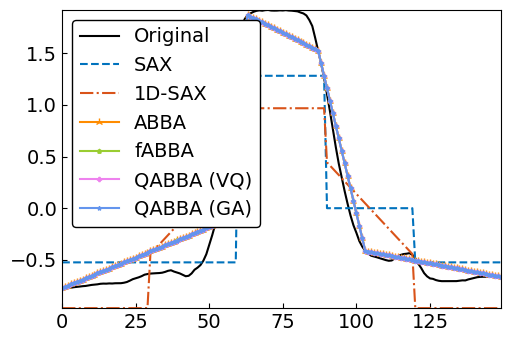

In [3]:

# Run through time series
index = 0
for root, dirs, files in os.walk(datadir):
    for file in files:
        if file.endswith('tsv'):
            print('file:', file)

            # bool to keep track of plots, one plot per classification.
            need_to_plot = True

            with open(os.path.join(root, file)) as tsvfile:
                tsvfile = csv.reader(tsvfile, delimiter='\t')

                for ind, column in tqdm(enumerate(tsvfile)):
                    ts_name[index] += str(file) + '_' + str(ind) # Save filename + index

                    ts = [float(i) for i in column] # convert to list of floats
                    ts = np.array(ts[1:]) # remove class information

                    # remove NaN from time series
                    ts = ts[~np.isnan(ts)]

                    # Z Normalise the times series
                    norm_ts = (ts -  np.mean(ts))
                    std = np.std(norm_ts, ddof=1)
                    std = std if std > np.finfo(float).eps else 1
                    norm_ts /= std
                    
                    try:
                        # Check length of time timeseries
                        if len(norm_ts) < 100:
                            raise(TimeSeriesTooShort)

                        # Reset tolerance
                        tol_index = 0

                        # ABBA (Adjust tolerance so at least 20% compression is used)
                        for tol_index in range(len(tol)):
                            abba = ABBA(tol=tol[tol_index], verbose=0)
                            pieces = abba.compress(norm_ts)
                            ABBA_len = len(pieces)
                            if ABBA_len <= len(norm_ts)/5:
                                tol_used[index] = tol[tol_index]
                                break
                            elif tol_index == len(tol)-1:
                                raise(CompressionTolHigh)
                        
                        try:
                            fabba = fABBA(verbose=0, alpha=0.5, scl=1, sorting='2-norm') 
                            st = time.time()
                            symbols_fabba, parameters_fabba = fabba.digitize(pieces[:,:2])
                            ed = time.time()
                            time_fabba = ed - st
                        except:
                            raise(fABBAError)
                            
                        try:
                            symbolnum = len(set(symbols_fabba))
                            abba1 = ABBA(scl=1, verbose=0, min_k=symbolnum, max_k=symbolnum)

                            st = time.time()
                            symbolic_ts1, centers1 = abba1.digitize(pieces)
                            ed = time.time()
                            time_abba1 = ed - st
                        except:
                            raise(ABBAError)
                            
                        try:
                            symbolnum = len(set(symbols_fabba))
                            qabba1 = fastQABBA(tol=0.1, init='kmeans', k=symbolnum, verbose=0, bits_for_len=8, bits_for_inc=12)
                            
                            st = time.time()
                            symbols_qabba1 = qabba1._digitize(pieces[:,:2])
                            ed = time.time()
                            time_qabba1 = ed - st
                        except:
                            raise(QABBA1Error)
                         
                        
                        try:
                            symbolnum = len(set(symbols_fabba))
                            qabba2 = fastQABBA(tol=0.1, init='agg', sorting='2-norm', alpha=0.5, verbose=0, bits_for_len=8, bits_for_inc=12)
                            
                            st = time.time()
                            symbols_qabba2 = qabba2._digitize(pieces[:,:2])
                            ed = time.time()
                            time_qabba2 = ed - st
                        except:
                            raise(QABBA2Error)
                            
                        csymbolicNum.append(symbolnum)
                        cpiecesNum.append(len(pieces))
                        ctsname.append(str(file) + '_' + str(ind))
                        ctolist.append(tol[tol_index])
                        
                        ts_ABBA1 = abba1.inverse_transform(symbolic_ts1, centers1, norm_ts[0])
                        ts_fABBA = inverse_compress(inverse_digitize(symbols_fabba, parameters_fabba), norm_ts[0])
                        ts_QABBA1 = qabba1.inverse_transform(symbols_qabba1, norm_ts[0])
                        ts_QABBA2 = qabba2.inverse_transform(symbols_qabba2, norm_ts[0])

                        # SAX
                        width = len(norm_ts) // ABBA_len # crop to equal number of segments as ABBA.
                        reduced_ts = SAX.compress(norm_ts[0:width*ABBA_len], width = width)
                        st = time.time()
                        symbolic_ts = SAX.digitize(reduced_ts, number_of_symbols = symbolnum)
                        ed = time.time()
                        SAX_len = len(symbolic_ts)
                        reduced_ts = SAX.reverse_digitize(symbolic_ts, number_of_symbols = symbolnum)
                        ts_SAX = SAX.reconstruct(reduced_ts, width = width)
                        time_sax = ed - st
                        
                        # oneD_SAX
                        width = max(len(norm_ts) // ABBA_len, 2) # crop to equal number of segments as ABBA.
                        slope = int(np.ceil(np.sqrt(symbolnum)))
                        intercept = int(np.ceil(np.sqrt(symbolnum)))
                        reduced_ts = oneD_SAX.compress(norm_ts[0:width*ABBA_len], width = width)
                        st = time.time()
                        symbolic_ts = oneD_SAX.digitize(reduced_ts, width, slope, intercept)
                        ed = time.time()
                        oneD_SAX_len = len(symbolic_ts)
                        reduced_ts = oneD_SAX.reverse_digitize(symbolic_ts, width, slope, intercept)
                        ts_oneD_SAX = oneD_SAX.reconstruct(reduced_ts, width = width)
                        time_oneD_sax = ed - st

                        # Compute distances
                        minlen1 = min(len(ts_SAX), len(norm_ts))
                        minlen2 = min(len(ts_oneD_SAX), len(norm_ts))
                        minlen3 = min(len(ts_ABBA1), len(norm_ts))
                        minlen4 = min(len(ts_fABBA), len(norm_ts))
                        minlen5 = min(len(ts_QABBA1), len(norm_ts))
                        minlen6 = min(len(ts_QABBA2), len(norm_ts))
                        
                        D_SAX_2[index]      = np.linalg.norm(norm_ts[:minlen1] - ts_SAX[:minlen1])
                        D_oneD_SAX_2[index] = np.linalg.norm(norm_ts[:minlen2] - ts_oneD_SAX[:minlen2])
                        D_ABBA1_2[index]    = np.linalg.norm(norm_ts[:minlen3] - ts_ABBA1[:minlen3])
                        D_fABBA_2[index]    = np.linalg.norm(norm_ts[:minlen4] - ts_fABBA[:minlen4])
                        D_QABBA1_2[index]    = np.linalg.norm(norm_ts[:minlen5] - ts_QABBA1[:minlen5])
                        D_QABBA2_2[index]    = np.linalg.norm(norm_ts[:minlen6] - ts_QABBA2[:minlen6])
                        
                        D_SAX_DTW[index]      = dtw(norm_ts[:minlen1], ts_SAX[:minlen1])
                        D_oneD_SAX_DTW[index] = dtw(norm_ts[:minlen2], ts_oneD_SAX[:minlen2])
                        D_ABBA1_DTW[index]    = dtw(norm_ts[:minlen3], ts_ABBA1[:minlen3])
                        D_fABBA_DTW[index]    = dtw(norm_ts[:minlen4], ts_fABBA[:minlen4])
                        D_QABBA1_DTW[index]    = dtw(norm_ts[:minlen5], ts_QABBA1[:minlen5])
                        D_QABBA2_DTW[index]    = dtw(norm_ts[:minlen6], ts_QABBA2[:minlen6])
                        
                        D_SAX_2_diff[index]       = np.linalg.norm(np.diff(norm_ts[:minlen1]) - np.diff(ts_SAX[:minlen1]))
                        D_oneD_SAX_2_diff[index]  = np.linalg.norm(np.diff(norm_ts[:minlen2]) - np.diff(ts_oneD_SAX[:minlen2]))
                        D_ABBA1_2_diff[index]     = np.linalg.norm(np.diff(norm_ts[:minlen3]) - np.diff(ts_ABBA1[:minlen3]))
                        D_fABBA_2_diff[index]     = np.linalg.norm(np.diff(norm_ts[:minlen4]) - np.diff(ts_fABBA[:minlen4]))
                        D_QABBA1_2_diff[index]     = np.linalg.norm(np.diff(norm_ts[:minlen5]) - np.diff(ts_QABBA1[:minlen5]))
                        D_QABBA2_2_diff[index]     = np.linalg.norm(np.diff(norm_ts[:minlen6]) - np.diff(ts_QABBA2[:minlen6]))
                        
                        D_SAX_DTW_diff[index]      =   dtw(np.diff(norm_ts[:minlen1]), np.diff(ts_SAX[:minlen1]))
                        D_oneD_SAX_DTW_diff[index] =   dtw(np.diff(norm_ts[:minlen2]), np.diff(ts_oneD_SAX[:minlen2]))
                        D_ABBA1_DTW_diff[index]     =  dtw(np.diff(norm_ts[:minlen3]), np.diff(ts_ABBA1[:minlen3]))
                        D_fABBA_DTW_diff[index]     =  dtw(np.diff(norm_ts[:minlen4]), np.diff(ts_fABBA[:minlen4]))
                        D_QABBA1_DTW_diff[index]     =  dtw(np.diff(norm_ts[:minlen5]), np.diff(ts_QABBA1[:minlen5]))
                        D_QABBA2_DTW_diff[index]     =  dtw(np.diff(norm_ts[:minlen6]), np.diff(ts_QABBA2[:minlen6]))
                        
                        # Compute time
                        D_SAX_time[index] = time_sax
                        D_oneD_SAX_time[index] = time_oneD_sax
                        D_ABBA1_time[index] = time_abba1
                        D_fABBA_time[index] = time_fabba
                        D_QABBA1_time[index] = time_qabba1
                        D_QABBA2_time[index] = time_qabba2
                        
                        compression[index] = ABBA_len/len(norm_ts) # Store compression amount
                        count[index] = len(norm_ts)
                        index += 1
                        
                        
                        if need_to_plot:
                            fig, ax = plt.subplots(1, 1)
                            fig, ax = figdefault(fig, ax, r=0.7)
                            plt.plot(norm_ts, c='k', label='Original')
                            plt.plot(ts_SAX, '--',  label='SAX')
                            plt.plot(ts_oneD_SAX, '-.', label='1D-SAX')
                            plt.plot(ts_ABBA1, marker='2', c='darkorange', label='ABBA')
                            plt.plot(ts_fABBA , marker='p', markersize=3, c='yellowgreen', label='fABBA')
                            plt.plot(ts_QABBA1, marker='P', markersize=3, c='violet', label='QABBA (VQ)')
                            plt.plot(ts_QABBA2 , marker='*', markersize=3, c='cornflowerblue', label='QABBA (GA)')
                            plt.legend(fontsize=14, loc='best')
                            plt.grid(False) # axis='y'
                            plt.tick_params(axis='both', labelsize=14)
                            plt.savefig('results/pp'+'/fig0.5/'+file[0:-4]+'.pdf')
                            need_to_plot = False

                    except(TypeError):
                        error[index] = 1
                        compression[index] = np.NaN
                        tol_used[index] = np.NaN
                        index += 1
                        pass
                        
                    except(TimeSeriesTooShort):
                        error[index] = 2
                        compression[index] = np.NaN
                        tol_used[index] = np.NaN
                        index += 1
                        pass

                    except(NotEnoughPieces):
                        error[index] = 3
                        compression[index] = np.NaN
                        tol_used[index] = np.NaN
                        index += 1
                        pass

                    except(CompressionTolHigh):
                        error[index] = 4
                        compression[index] = np.NaN
                        tol_used[index] = np.NaN
                        index += 1
                        pass

                    except(UnknownError):
                        error[index] = 5
                        compression[index] = np.NaN
                        tol_used[index] = np.NaN
                        index += 1
                        pass
                    
                    except(ValueError):
                        error[index] = 6
                        compression[index] = np.NaN
                        tol_used[index] = np.NaN
                        index += 1
                        pass
                    
                    except(ABBAError):
                        error[index] = 7
                        compression[index] = np.NaN
                        tol_used[index] = np.NaN
                        index += 1
                        pass
                    
                    except(fABBAError):
                        error[index] = 8
                        compression[index] = np.NaN
                        tol_used[index] = np.NaN
                        index += 1
                        pass
                    
                    except(QABBA1Error):
                        error[index] = 9
                        compression[index] = np.NaN
                        tol_used[index] = np.NaN
                        index += 1
                        pass
                    
                    except(QABBA2Error):
                        error[index] = 10
                        compression[index] = np.NaN
                        tol_used[index] = np.NaN
                        index += 1
                        pass
D = {}
D['ts_name'] = ts_name
D['compression'] = compression
D['tol_used'] = tol_used
D['error'] = error
D['tol'] = tol

D['SAX_2'] = D_SAX_2
D['oneD_SAX_2'] = D_oneD_SAX_2
D['ABBA_2'] = D_ABBA1_2
D['fABBA_2'] = D_fABBA_2
D['QABBA1_2'] = D_QABBA1_2
D['QABBA2_2'] = D_QABBA2_2

D['SAX_DTW'] = D_SAX_DTW
D['oneD_SAX_DTW'] = D_oneD_SAX_DTW
D['ABBA_DTW'] = D_ABBA1_DTW
D['fABBA_DTW'] = D_fABBA_DTW
D['QABBA1_DTW'] = D_QABBA1_DTW
D['QABBA2_DTW'] = D_QABBA2_DTW

D['SAX_2_diff'] = D_SAX_2_diff
D['oneD_SAX_2_diff'] = D_oneD_SAX_2_diff
D['ABBA_2_diff'] = D_ABBA1_2_diff
D['fABBA_2_diff'] = D_fABBA_2_diff
D['QABBA1_2_diff'] = D_QABBA1_2_diff
D['QABBA2_2_diff'] = D_QABBA2_2_diff

D['SAX_DTW_diff'] = D_SAX_DTW_diff
D['oneD_SAX_DTW_diff'] = D_oneD_SAX_DTW_diff
D['ABBA_DTW_diff'] = D_ABBA1_DTW_diff
D['fABBA_DTW_diff'] = D_fABBA_DTW_diff
D['QABBA1_DTW_diff'] = D_QABBA1_DTW_diff
D['QABBA2_DTW_diff'] = D_QABBA2_DTW_diff

D['SAX_time'] =  D_SAX_time
D['oneD_SAX_time'] = D_oneD_SAX_time
D['ABBA_time'] = D_ABBA1_time
D['fABBA_time'] = D_fABBA_time
D['QABBA1_time'] = D_QABBA1_time
D['QABBA2_time'] = D_QABBA2_time

with open('results/QABBA0.5'+'.p', 'wb') as handle:
    pickle.dump(D, handle, protocol=pickle.HIGHEST_PROTOCOL)
    
Datastore = pd.DataFrame(columns=["ts name", "number of pieces", "number of symbols","tol"])
Datastore["ts name"] = ctsname
Datastore["number of pieces"] = cpiecesNum 
Datastore["number of symbols"] = csymbolicNum  
Datastore["tol"] = ctolist 
Datastore.to_csv("results/QABBA0.5sl.csv",index=False)